# <font color='red'>TME ROBOTIQUE ET APPRENTISSAGE</font>
# <font color='red'>Stratégies d'Evolution et Robotique Autonome</font>

<font color="red">Version étudiant 2021</font>

*mise à jour: 5/3/2021*

Ce notebook doit être exécuté dans [Google Colab](colab.research.google.com/)

Vous devez déposer votre travail sur Moodle:
* déposer votre notebook, avec le nom de fichier *obligatoirement* au format suivant: **RA_NOM1_NOM2.ipynb**
* toutes les cellules exécutées
* des graphes et un bref commentaire lorsque c'est demandé
* la partie C ne sera pas évaluée

*Le sujet est à faire en binome.*

# COMPLETEZ LES CHAMPS CI-DESSOUS AVEC NOM/PRENOM/CARTE_ETU:

* Étudiant 1: **_FU_ _Vincent_ _3681685_**
* Étudiant 2: **_LIU_ _Yuhao_ _3703494_**



# <font color='orange'>PARTIE A: optimisation dans un espace de recherche continu</font>

# Importation des librairies et définition des fonctions utiles pour la partie A

Remarque: *Il est nécessaire d'exécuter ces cellules une seule fois. En cas de redémarrage du noyau, il faut relancer ces cellules. Il n'est pas nécessaire de regarder le code de ces cellules, elles servent seulement de soutien à la partie A.*

In [45]:
from datetime import datetime
from datetime import date
#import importlib # une seule fois
import sys
import random
import matplotlib.pyplot as plt
#from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from scipy.optimize import minimize

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:48:55 GMT
OK.


In [46]:
#!pip install numpy scipy matplotlib pandas sympy nose
!pip install deap
!pip install cma
#!pip install --user pygame

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:49:00 GMT
OK.


In [47]:
# plot

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import random
from scipy.optimize import minimize


def plot_results(my_func, my_points, min_x=-30, max_x=30, min_y=-30, max_y=30, nbx=100, nby=100, title="Title"):
    """Plots a 2D function with a heatmap and the points given as argument are plotted on top of it

    Plots a 2D function with a heatmap and the points given as argument are plotted on top of it:
    :param my_func: the function to plot on the background
    :param my_points: the points to plot
    :param min_x: min value of x
    :param max_x: max value of x
    :param min_y: min value of y
    :param max_y: max value of y
    :param nbx: number of my_func samples on the X-axis
    :param nby: number of my_func samples on the Y-axis
    :param title: title of the figure
    """
    X = np.linspace(min_x, max_x, num=nbx)
    Y = np.linspace(min_y, max_y, num=nby)
    Z=np.zeros((nbx,nby),dtype=np.double)
    for i in range(nbx):
        for j in range(nby):
            Z[i][j]=my_func([X[i],Y[j]])
    fig,ax=plt.subplots(figsize=(5,5))
    ax.set_xlim(min_x,max_x)
    ax.set_ylim(min_y,max_y)
    ax.imshow(Z, cmap='hot', interpolation='nearest',extent=(min_x,max_x,min_y,max_y))
    
    #print("Points: "+str(my_points))
    x=[]
    y=[]
    for p in my_points:
        x.append(p[0])
        y.append(p[1])

    ax.plot(x,y,".")
    ax.set_title(title)
    plt.show()

def plot_violin(res):
    """ Makes a violin plot of the results provided in the argument

    Makes a violin plot of the results provided in the argument.
    :param res: dictionary of the results to plot. The key is the name and the data is a vector of performance values.
    """
    fig,ax=plt.subplots(figsize=(5,5))
    data=[]
    labels=[]
    for k in res.keys():
        data.append(res[k])
        labels.append(k)
    ax.violinplot(data,
                   showmeans=False,
                   showmedians=True)
    ax.set_title('Violin plot')
    # adding horizontal grid lines
    ax.yaxis.grid(True)
    ax.set_xticks([y + 1 for y in range(len(data))])
    ax.set_xlabel('Optimization methods')
    ax.set_ylabel('Best value found')

    # add x-tick labels
    plt.setp(ax, xticks=[y + 1 for y in range(len(data))],
        xticklabels=labels)
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right")
    plt.show()
  
print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:49:00 GMT
OK.


In [48]:
# myEvalFn
# requires: CMA

import sys
import cma
import cma.purecma as purecma
from deap import benchmarks

def ackley(x):
    return benchmarks.ackley(x)[0]

def sphere(x):
    return benchmarks.sphere(x)[0]

def rastrigin(x):
    return benchmarks.rastrigin(x)[0]


#### #### ####

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:49:00 GMT
OK.


In [49]:
# myEvalFn

def ackley(x):
    return benchmarks.ackley(x)[0]

def sphere(x):
    return benchmarks.sphere(x)[0]

def rastrigin(x):
    return benchmarks.rastrigin(x)[0]

init_pSG = False # WARNING: pSG.initAll() should NEVER be called BEFORE calling explore(.)
def explore(x):  # NOTE: display should be false whenever an optimiser is called
    global init_pSG
    if init_pSG == False:
        pSG.initAll()
        init_pSG = True
    return -pSG.evaluate(x)   # remember: we minimise!

#### #### ####

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:49:00 GMT
OK.


---

# Exercice A-0: recherche au hasard

Etudiez le code ci-dessous. Il s'agit d'un algorithme de recherche aléatoire, qui explore l'environnement naïvement et stocke le meilleur score obtenu jusqu'ici. Vous testerez cette bibliothèque sur la fonction de Sphere, Ackley, puis Rastrigin, en dimension 2 pour l'instant. Observez l'évolution de la population. Vous étudierez l'impact du choix du point initial. **Le code se trouve le fichier `myRandom.py`**.

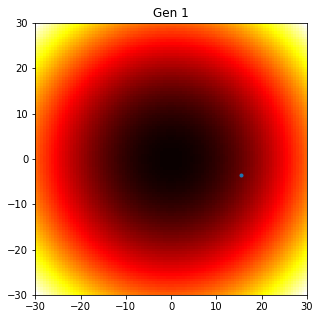

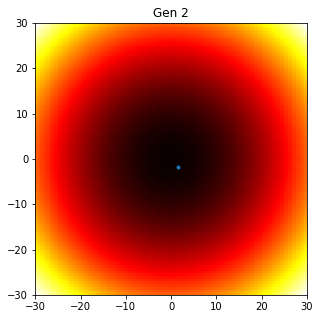

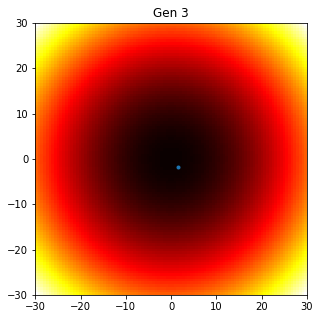

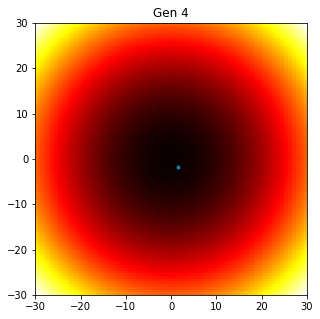

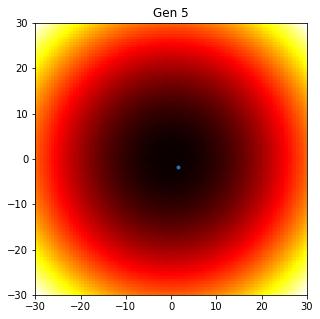

...

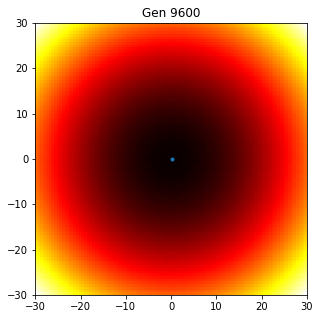

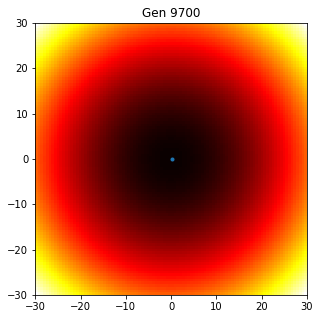

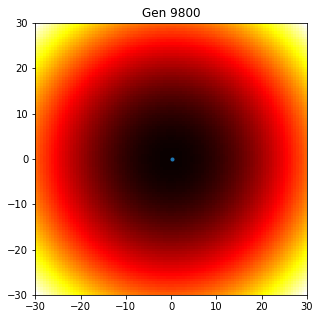

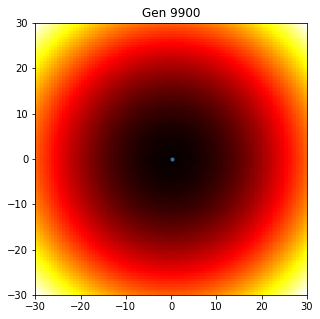

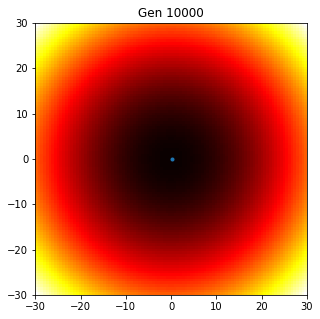

Best fit 0.028549646583362884 at iteration 4310
Terminé.


In [50]:
# fourni a titre d'exemple, ne pas modifier -- reprendre ce code et le modifier dans les cellules suivantes pour répondre aux questions.

def launch_random(center, nbeval=10000, display=True, ma_func=sphere):
    parent = np.array(center)
    i=0
    j=0
    parentFit = ma_func(parent)
    bestFit = parentFit
    bestIt = 0
    while i<nbeval:
        child = np.random.uniform(-20,20,len(center))
        childFit = ma_func(child)
        if childFit <= parentFit:
            parentFit = childFit
            parent = np.copy(child)
            if bestFit > parentFit:
                bestFit = parentFit
                bestIt = i
        j+=1
        solutions = np.array([parent])
        if display and ((j<10) or (j%100==0)):
            plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
    print ("Best fit",bestFit,"at iteration",bestIt)
    return bestFit

launch_random([20]*2,ma_func=sphere)

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

La recherche au hasard évolue aléatoirement mais toujours en se rapprochant de l'optimum (s'il est unique et car on converve toujours la meilleure solution). Selon le tirage aléatoire, on arrive plus ou moins proche de l'optimum.

---

# Exercice A-1: algorithme (1+1)-ES

Nous allons maintenant implementer une stratégie d'évolution (1+1)-ES avec un sigma fixe.

Vous testerez cet algorithme sur les mêmes fonctions que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma.

A noter que si la valeur de sigma peut influer significativement l'optimisation, l'initialisation compte aussi. Par exemple, si la solution initialement proposée se trouve dans une région ressemblant à un plateau (ie. plusieurs solutions proches obtiennent le même score), il sera difficile d'améliorer cette solution puisqu'une recherche locale s'apparentera à une marche aléatoire.

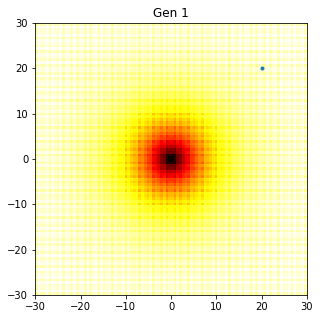

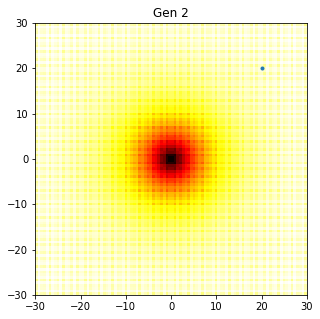

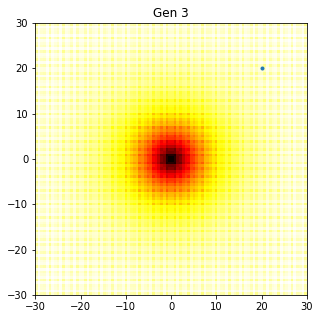

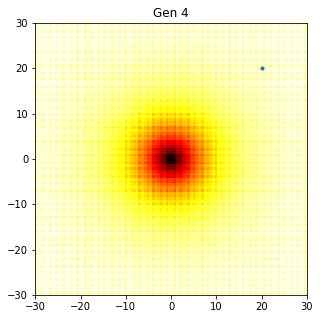

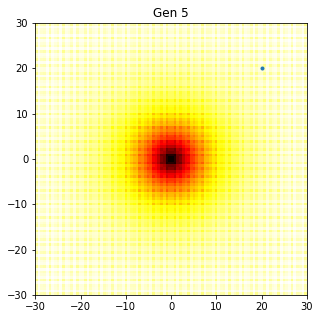

...

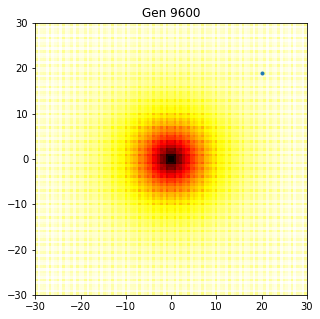

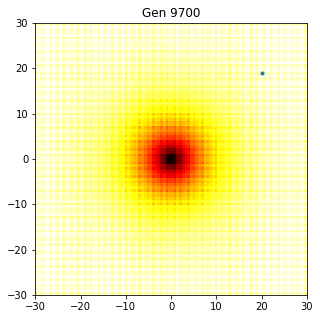

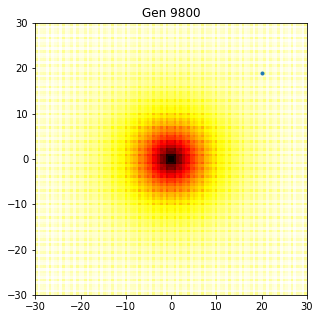

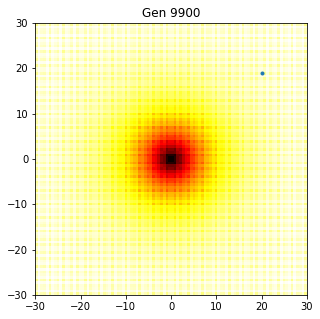

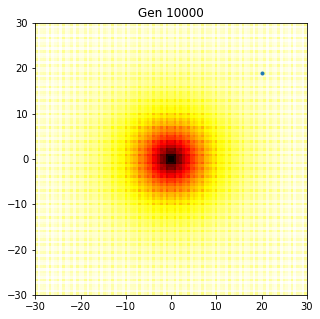

Best fit 19.598327501334424 at iteration 9332
Terminé.


In [51]:
def launch_oneplusone(center, sigma, nbeval=10000, display=True, ma_func=sphere):
    parent = np.array(center)
    i=0
    j=0
    parentFit = ma_func(parent)
    bestFit = parentFit
    bestIt = 0
    while i < nbeval:
      child = parent + sigma * np.random.normal(size=len(center))
      childFit = ma_func(child)
      if childFit <= parentFit:
        parentFit = childFit
        parent = np.copy(child)
        if bestFit > parentFit:
          bestFit = parentFit
          bestIt = i
      j+=1
      solutions = np.array([parent])
      if display and ((j<10) or (j%100==0)):
        plot_results(ma_func,solutions, title="Gen %d"%(j))
      i+=1
    print ("Best fit",bestFit,"at iteration",bestIt)
    return bestFit

launch_oneplusone([20, 20], 0.3, ma_func=ackley)

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

1.   En analysant le paramètre $\sigma$, on observe qu'il correspond finalement à la zone de recherche au voisinage du parent courant. Plus précisément si $\sigma$ est très petit, on converge très lentement vers un optimum local (il faut donc un grand nombre d'itération pour atteindre l'optimum) car la zone de recherche est trop petite pour améliorer rapidement la population. Si $\sigma$ est grand, on converge rapidement vers un optimum.
2.   Concernant le point initial, selon la fonction utilisée pour le calcul du fitness, il est possible qu'on n'observe pas d'évolution de population car si le point initial est au voisinage d'une zone ayant des motifs qui répètent avec mêmes amplitudes pour chaque motif (comme une sinusoïde simple), l'algorithme n'arrive pas à détecter des améliorations (exemple : la fonction ackley). Pour remédier à ce problème il faut donner un $\sigma$ assez grand pour qu'il détecte les zones améliorants.





---

# Exercice A-2: algorithme (1+1)-ES, règle des 1/5e

Nous allons maintenant implementer une stratégie d'évolution (1+1)-ES avec un sigma suivant la règle des 1/5e.

Vous testerez cette algorithme sur les mêmes fonction que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma.

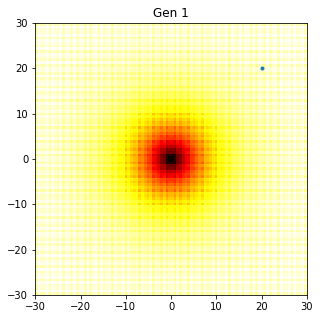

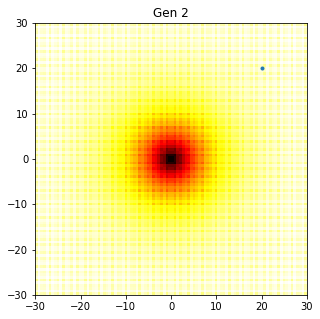

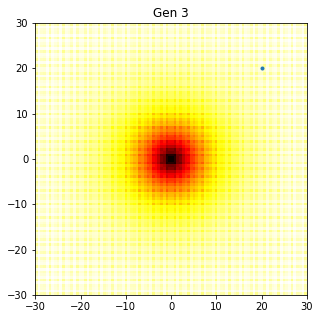

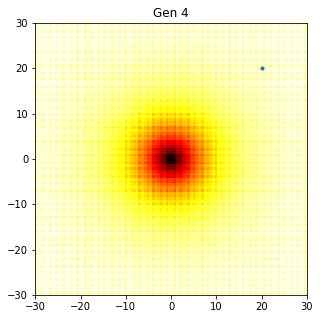

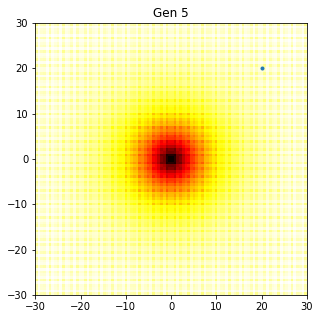

...

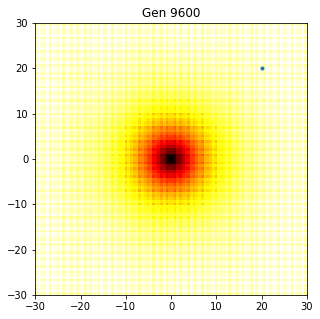

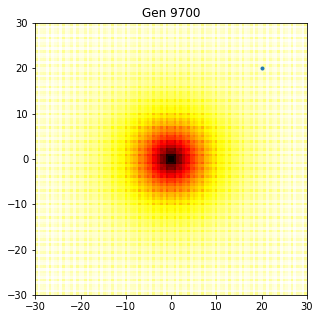

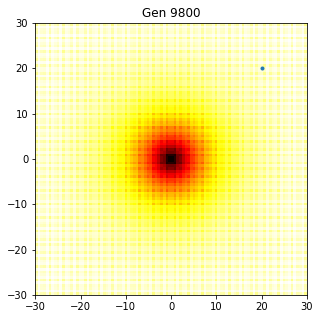

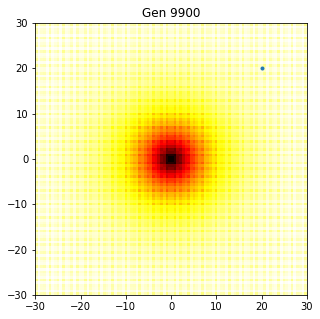

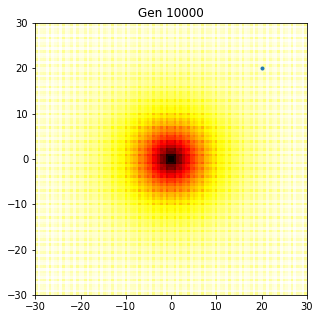

Best fit 19.633662210601795 at iteration 220
Terminé.


In [52]:
def launch_ESonefifthRule(center, sigma, nbeval=10000, display=True, ma_func=sphere):
    parent = np.array(center)
    i=0
    j=0
    parentFit = ma_func(parent)
    bestFit = parentFit
    bestIt = 0
    sigmat = sigma
    while i < nbeval:
        child = parent + sigmat * np.random.normal(size=len(center))
        childFit = ma_func(child)
        if childFit <= parentFit:
          parentFit = childFit
          parent = np.copy(child)
          sigmat = 2 * sigmat 
          if bestFit > parentFit:
            bestFit = parentFit
            bestIt = i
        else:
          sigmat = 2 ** (-1/4) * sigmat

        j+=1
        solutions = np.array([parent])
        if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
    print("Best fit",bestFit,"at iteration",bestIt)
    return bestFit

launch_ESonefifthRule([20, 20] , 0.3, ma_func=ackley)

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_



1.   Même idée que les commentaires précédents, sauf qu'ici nous avons un pas varaible à chaque itération. Or, quand on n'a pas d'évolution de population à une itération, on réduit le pas de recherche. Quand on trouve une évolution, on augmente le pas de recherche.
2.   De ce fait, lorsqu'on est coincé dans une zone de répétitions de motifs identiques 
(c'est possible pour la fonction ackley), la règle des 1/5e est inefficace puisque sachant qu'on est toujours coincé au point initial, on va toujours réduire le pas (ou obtenir un pas borné à cause des sinusoïdes de mêmes amplitudes) et donc être coincé au point initial.





---

# Exercice A-3: algorithme (mu,lambda)-ES

Vous testerez cette algorithme sur les mêmes fonction que précédemment. Vous tracerez l'évolution de la population pour chaque exécution. Vous étudierez l'impact du choix du point initial et du sigma. 

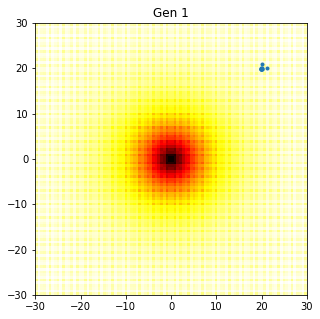

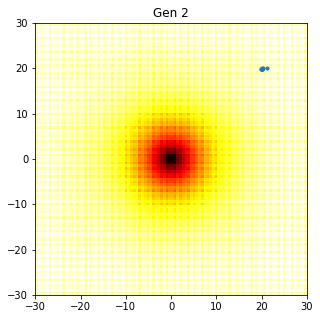

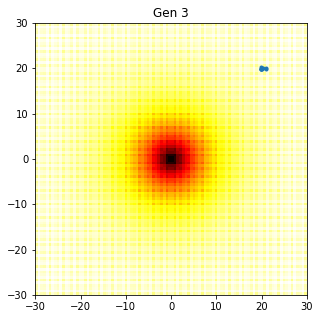

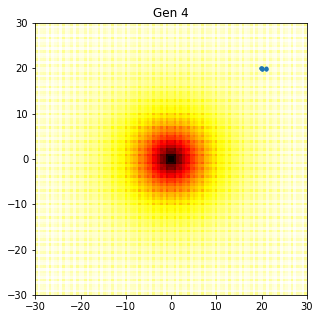

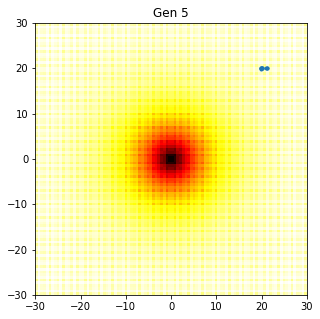

...

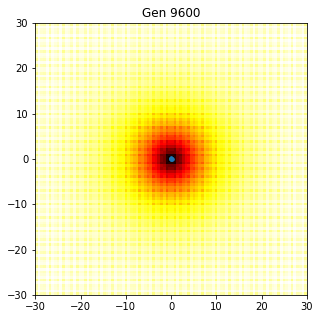

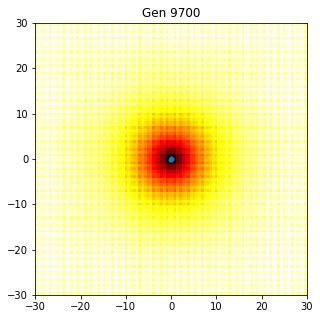

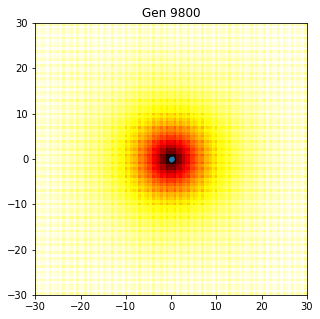

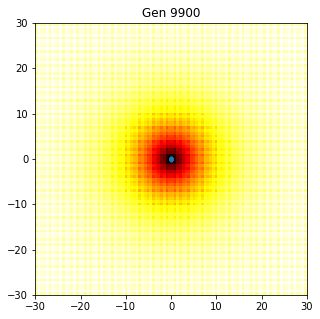

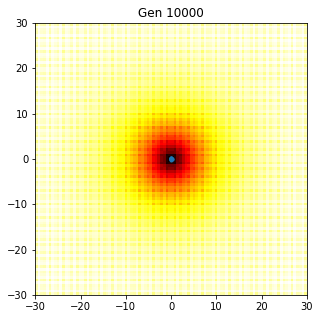

Best fit 0.0012120201134266928 at iteration 6677
Terminé.


In [53]:
def launch_LambdaES(center, _mu, _lambda, sigma, nbeval=10000, display=True, ma_func=sphere):
    parent = np.array([center for i in range(_lambda)]) 
    i=0
    j=0
    sigmat = sigma
    besti = 0
    bests = ma_func(center)
    while i < nbeval:
        child = parent + sigmat * np.random.normal(size=parent.shape)
        f = np.array([ma_func(p) for p in child])
        bestFit = np.sort(f)[:_mu]
        bestinds = [np.where(f == bestFit[k])[0][0] for k in range(_mu)]
        j+=1
        solutions = child[bestinds]
        if ma_func(solutions[0]) < bests:
          bests = ma_func(solutions[0])
          besti = i
        parent = np.array([solutions[np.random.randint(len(solutions))] for i in range(_lambda)])
        if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
    print("Best fit",bests,"at iteration",besti)
    return bestFit

launch_LambdaES([20, 20], 10, 50, 0.3, ma_func=ackley)

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

L'algorithme ($\mu$, $\lambda$)-ES ressemble à (1+1)-ES mais avec plus d'échantillons. Cependant, la différence est qu'on ne converge pas exactement à l'optimum mais on y reste à un voisinage très proche puisque on ne sauvegarde pas les meilleurs individus sur toute la population.  
En outre, on remarque que pour un $\sigma = 0.3
$, l'algorithme ($\mu$, $\lambda$)-ES arrive à converger pour la fonction ackley alors que les ES précédentes n'arrivent pas.
L'impact du choix initial et du sigma sont donc identiques au cas de (1+1)-ES sauf avec moins d'intensité (Il faut un sigma plus grand pour (1+1)-ES que pour ($\mu$, $\lambda$)-ES pour obtenir la même convergence.). 

---

# Exercice A-4: algorithme CMA-ES

Nous allons maintenant utiliser CMA-ES. La version standard est celle proposée dans la bibliothèque pycma (https://github.com/CMA-ES/pycma).

Vous testerez cette bibliothèque sur les mêmes fonctions que précédemment, toujours en dimension 2 pour l'instant. De même que précédemment, vous tracerez l'évolution de la population pour chaque exécution. 

Vous étudierez l'impact du choix du point initial et du sigma. Vous comparerez également la version complète avec la version pureCMA, qui n'inclut pas certains mécanismes comme le restart. 

(3_w,6)-aCMA-ES (mu_w=2.0,w_1=63%) in dimension 2 (seed=705909, Thu Mar 25 00:50:39 2021)


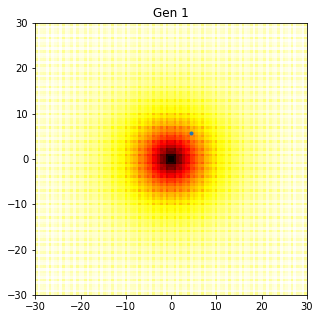

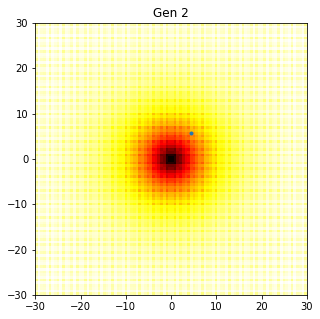

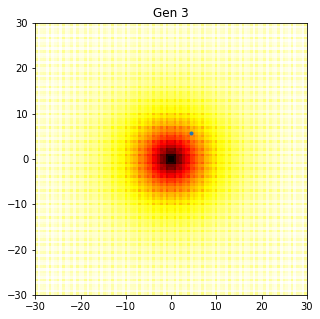

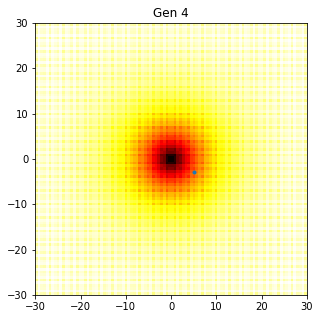

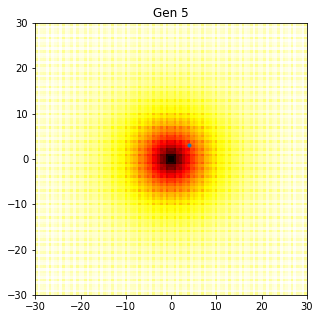

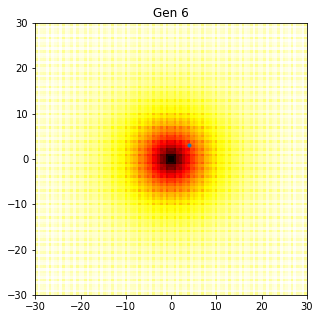

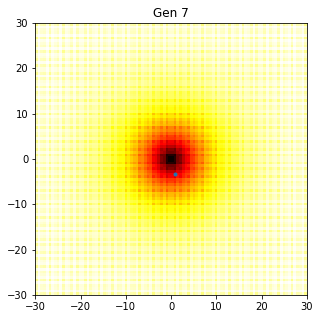

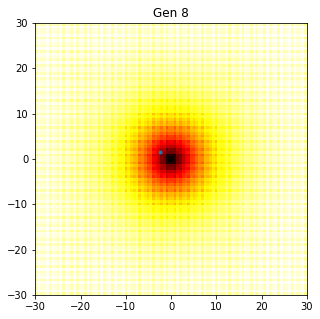

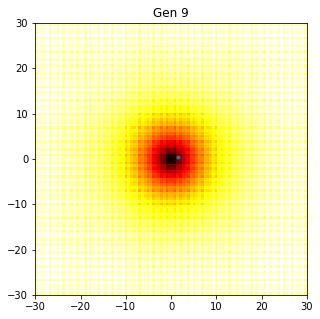

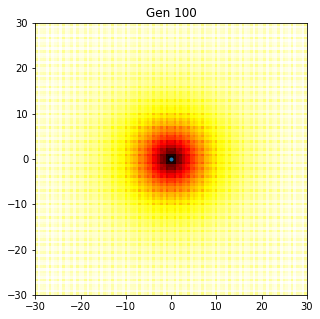

Best fit 1.5074164139150525e-11 at iteration 116
Terminé.


In [54]:
def launch_cmaes_full(center, sigma, nbeval=10000, display=True, ma_func=sphere):
    es = cma.CMAEvolutionStrategy(np.array(center), sigma)
    i=0
    j=0
    bestFit = ma_func(center)
    bestIt = 0
    while i < nbeval and not es.stop():
        child = es.ask()
        f = np.array([ma_func(p) for p in child])
        es.tell(child, f)
        solutions = np.array([es.result[0]])
        if ma_func(es.result[0]) < bestFit:
          bestFit = ma_func(es.result[0])
          bestIt = i
        j+=1
        if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
    print("Best fit",bestFit,"at iteration", bestIt)
    return bestFit

launch_cmaes_full([20, 20], 20, ma_func=ackley)

print ("Terminé.")

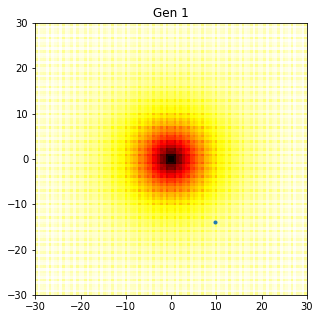

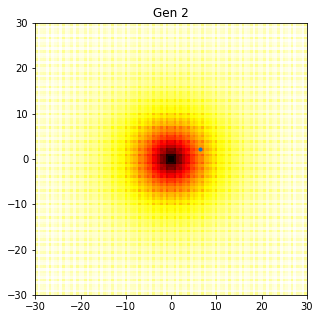

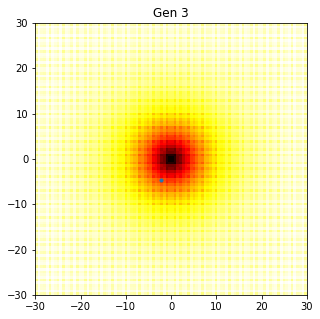

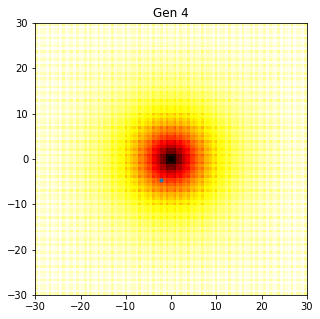

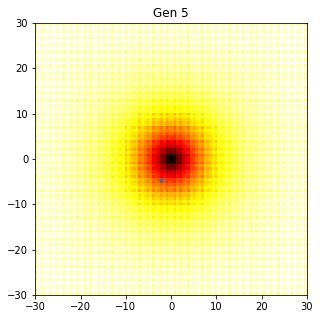

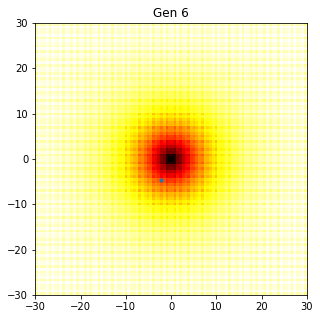

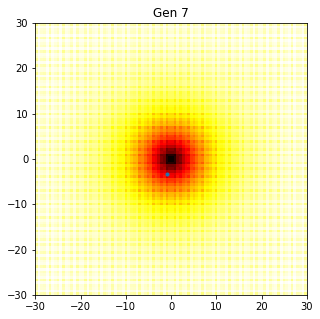

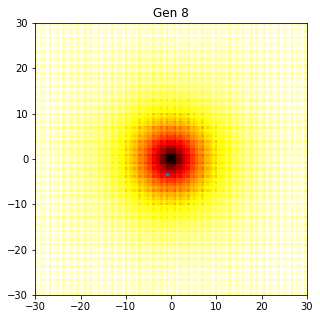

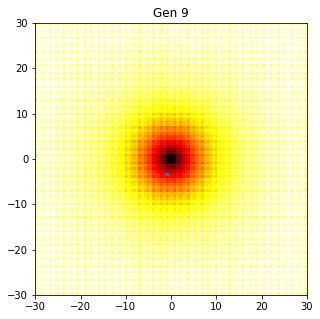

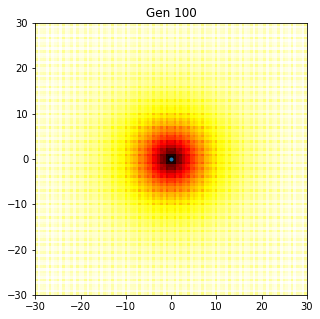

Best fit 7.975842208907125e-12 at iteration 152
Terminé.


In [55]:
# does not use restart
def launch_cmaes_pure(center, sigma, nbeval=10000, display=True, ma_func=sphere):
  # A compléter
  es = cma.purecma.CMAES(np.array(center), sigma)
  i=0
  j=0
  bestFit = ma_func(center)
  bestIt = 0
  while i < nbeval and not es.stop():
        child = es.ask()
        f = np.array([ma_func(p) for p in child])
        es.tell(child, f)
        solutions = np.array([es.result[0]])
        if ma_func(es.result[0]) < bestFit:
          bestFit = ma_func(es.result[0])
          bestIt = i
        j+=1
        if display and ((j<10) or (j%100==0)):
          plot_results(ma_func,solutions, title="Gen %d"%(j))
        i+=1
  print("Best fit",bestFit,"at iteration", bestIt)
  return bestFit

launch_cmaes_pure([20, 20], 20, ma_func=ackley)

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

L'impact du choix initial et du sigma sont identiques aux ES précédentes sauf qu'ici il faut un $\sigma$ beaucoup plus grand que celui de ($\mu$, $\lambda$)-ES pour converger dans le cas de la fonction ackley. Cependant, dans le cas d'une convergence, on converge avec beaucoup moins d'itérations que les ES précédentes. Concernant la différence entre CMA full et CMA pure, en observant qu'une exécution à la fois, la différence n'est pas assez claire.

---

# Exercice A-5: stabilité des algorithmes d'optimisation stochastique

Vous allez maintenant comparer la stochasticité des algorithmes. Pour cela, observez le code ci-dessous, qui affiche le résultat de plusieurs exécutions du même algorithme de recherche aléatoire sous forme de violin graph. Utilisez la fonction Sphere, tester aussi avec la fonction Rastrigin. 


Best fit 862.7027451637667 at iteration 581
Best fit 695.7603634485295 at iteration 432
Best fit 672.6198904510937 at iteration 247
Best fit 694.2378823247583 at iteration 872
Best fit 823.0397832492973 at iteration 553
Best fit 535.3910238887279 at iteration 268
Best fit 705.117924344535 at iteration 11
Best fit 482.6743396450124 at iteration 302
Best fit 678.9727598758275 at iteration 928
Best fit 932.7248587390118 at iteration 434
Best fit 751.9776071814906 at iteration 432
Best fit 933.8182002050353 at iteration 881
Best fit 698.5697663934307 at iteration 503
Best fit 584.4052966155376 at iteration 186
Best fit 646.0319976373767 at iteration 364
Best fit 633.428568052175 at iteration 201
Best fit 668.1743942687308 at iteration 496
Best fit 904.8251539397828 at iteration 992
Best fit 854.8815922296208 at iteration 359
Best fit 921.9380182611629 at iteration 684
Best fit 778.5973618993334 at iteration 518
Best fit 587.0833199768774 at iteration 425
Best fit 808.4547739611519 at itera

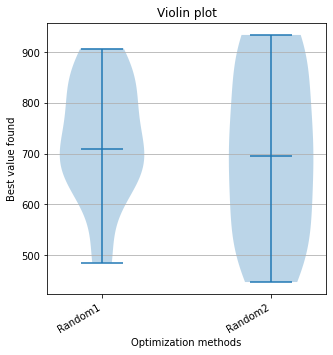

Terminé.


In [56]:
# fourni a titre d'exemple, ne pas modifier -- répondre dans la cellule suivante.

resRandom1 = []
resRandom2 = []

evaluationBudget = 1000
centerInit = [20] * 16
evalFunc = sphere

for i in range(20):
    resRandom1.append ( launch_random(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resRandom2.append ( launch_random(centerInit,nbeval=evaluationBudget,display=False,ma_func=evalFunc) )    
    
allResults = {"Random1":resRandom1,"Random2":resRandom2}

plot_violin( allResults )

print ("Terminé.")


Testez la robustesse de CMA-ES sur plusieurs exécutions sur ces deux fonctions. Vous pouvez ré-utiliser le code de la cellule précédente pour afficher le résultat de plusieurs exécutions de CMAES (ex.: 5 exécutions).

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=729049, Thu Mar 25 00:50:44 2021)
Best fit 13.929421761487049 at iteration 638
Best fit 20.894099850969013 at iteration 484
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=713069, Thu Mar 25 00:50:51 2021)
Best fit 22.884038161869427 at iteration 574
Best fit 28.85378242879142 at iteration 458
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=638842, Thu Mar 25 00:50:57 2021)
Best fit 13.929416723667941 at iteration 441
Best fit 30.843685384082505 at iteration 503
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=710998, Thu Mar 25 00:51:02 2021)
Best fit 15.919334837854564 at iteration 479
Best fit 31.838659600071736 at iteration 534
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=780467, Thu Mar 25 00:51:08 2021)
Best fit 29.848726326988924 at iteration 496
Best fit 22.884038161869853 at iteration 534
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=739460, Thu Mar 25 00:51:15 2021)

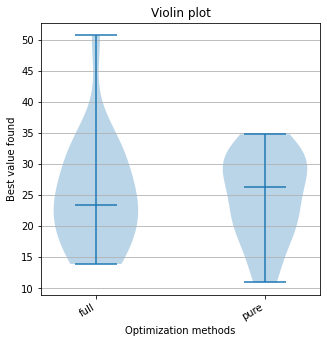

Terminé.


In [57]:
# A compléter

res1 = []
res2 = []

evaluationBudget = 1000
centerInit = [20]*16
evalFunc = rastrigin
sigma = 100

for i in range(20):
    res1.append ( launch_cmaes_full(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    res2.append ( launch_cmaes_pure(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )    
    
allResults = {"full":res1,"pure":res2}

plot_violin( allResults )

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

En observant le graphe, on remarque les résultats du CMA pure sont beaucoup plus regroupés vers sa moyenne alors que les résultats du CMA full sont répartis plutôt de manière homogène.
 




# Exercice A-6: comparaison entre les algorithmes

 Vous allez maintenant comparer tous les algorithmes précédents en traçant les résultat sur une même figure. Sur la même figure, vous tracerez aussi les résultats de deux méthodes classiques d'optimisation: Nelder-Mead et Powell (cf. **fichier `myCMA.py`**).  Vous pouvez tout écrire dans la cellule ci-dessous.

_Remarque: Pour que les comparaisons soient équitables, il faut que les points de départ des optimisation "classiques" soient similaires. Vous pourrez éventuellement ajouter un diagramme représentant le nombre d'évaluation par méthode._

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=757945, Thu Mar 25 00:52:44 2021)
Best fit 1.9434292176877748e-14 at iteration 341
Best fit 9.711139957379107e-13 at iteration 338
Best fit 15.689061825676985 at iteration 922
Best fit 889.5919565332756 at iteration 725
Best fit 3.3403571134749267e-06 at iteration 998
Best fit 3.416728627619157
Best fit 1.5182896609313968e-23
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=731755, Thu Mar 25 00:52:48 2021)
Best fit 1.4452795827425563e-14 at iteration 329
Best fit 3.1186697959988296e-13 at iteration 342
Best fit 28.802823424295656 at iteration 862
Best fit 900.7403126124132 at iteration 994
Best fit 9.524001317044105e-06 at iteration 998
Best fit 3.416728627619157
Best fit 1.5182896609313968e-23
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=707832, Thu Mar 25 00:52:52 2021)
Best fit 3.871061346187119e-14 at iteration 348
Best fit 2.3658803983021316e-13 at iteration 352
Best fit 25.846025624940637 at iteratio

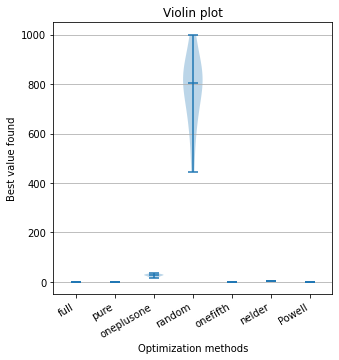

Terminé.


In [58]:
resCMAfull = []
resCMApure = []
resOneplusone = []
resRandom = []
resOneFifthRule = []
resNelder = []
resPowell = []

def launch_nelder(center, nbeval=10000, display=False, ma_func=sphere): 
  nelder = minimize(ma_func, center, method='nelder-mead',options={'xtol': 1e-8, 'disp': display}) 
  print("Best fit", nelder.fun)
  return nelder.fun

def launch_powell(center, nbeval=10000, display=False, ma_func=sphere): 
  powell = minimize(ma_func, center, method='powell',options={'xtol': 1e-8, 'disp': display}) 
  print("Best fit", powell.fun)
  return powell.fun


# A compléter

evaluationBudget = 1000
centerInit = [20]*16
evalFunc = sphere
sigma = 2

for i in range(20):
    resCMAfull.append ( launch_cmaes_full(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resCMApure.append ( launch_cmaes_pure(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resOneplusone.append ( launch_oneplusone(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resRandom.append ( launch_random(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )  
    resOneFifthRule.append( launch_ESonefifthRule(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resNelder.append ( launch_nelder(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resPowell.append ( launch_powell(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc))

allResults = {"full":resCMAfull,"pure":resCMApure, "oneplusone":resOneplusone, "random":resRandom, "onefifth":resOneFifthRule, "nelder":resNelder, "Powell":resPowell}

plot_violin( allResults )

print ("Terminé.")

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=780933, Thu Mar 25 00:54:07 2021)
Best fit 2.4577673229941865e-11 at iteration 595
Best fit 2.793854037008714e-11 at iteration 554
Best fit 19.633687222225316 at iteration 0
Best fit 16.329491367565055 at iteration 471
Best fit 19.633662210608904 at iteration 996
Best fit 19.63366221060182
Best fit 19.63366221060202
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=675292, Thu Mar 25 00:54:15 2021)
Best fit 2.454214609315386e-11 at iteration 773
Best fit 2.4577673229941865e-11 at iteration 538
Best fit 19.633687222225316 at iteration 0
Best fit 16.470397386183414 at iteration 741
Best fit 19.63366221060204 at iteration 993
Best fit 19.63366221060182
Best fit 19.63366221060202
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=708326, Thu Mar 25 00:54:22 2021)
Best fit 2.7220892206969438e-11 at iteration 506
Best fit 19.63263000113394 at iteration 386
Best fit 19.633687222225316 at iteration 0
Best fit 16.942229154

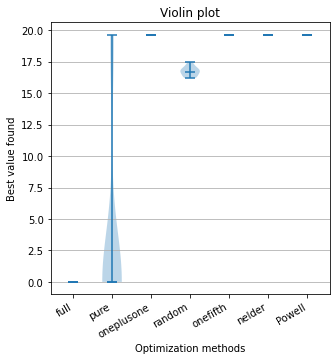

Terminé.


In [59]:
resCMAfull = []
resCMApure = []
resOneplusone = []
resRandom = []
resOneFifthRule = []
resNelder = []
resPowell = []

evaluationBudget = 1000
centerInit = [20]*16
evalFunc = ackley
sigma = 2

for i in range(20):
    resCMAfull.append ( launch_cmaes_full(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resCMApure.append ( launch_cmaes_pure(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resOneplusone.append ( launch_oneplusone(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resRandom.append ( launch_random(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )  
    resOneFifthRule.append( launch_ESonefifthRule(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resNelder.append ( launch_nelder(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resPowell.append ( launch_powell(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc))

allResults = {"full":resCMAfull,"pure":resCMApure, "oneplusone":resOneplusone, "random":resRandom, "onefifth":resOneFifthRule, "nelder":resNelder, "Powell":resPowell}

plot_violin( allResults )

print ("Terminé.")

(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=750108, Thu Mar 25 00:56:29 2021)
Best fit 34.82351153681725 at iteration 481
Best fit 27.858747439762567 at iteration 453
Best fit 149.66847855807345 at iteration 558
Best fit 881.487202633595 at iteration 391
Best fit 557.1506476045347 at iteration 998
Best fit 6366.509571835735
Best fit 0.0
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=732829, Thu Mar 25 00:56:35 2021)
Best fit 26.86385419352817 at iteration 431
Best fit 18.904206971315716 at iteration 436
Best fit 150.78652706230753 at iteration 407
Best fit 729.969177685578 at iteration 259
Best fit 226.84555926270738 at iteration 997
Best fit 6366.509571835735
Best fit 0.0
(6_w,12)-aCMA-ES (mu_w=3.7,w_1=40%) in dimension 16 (seed=791757, Thu Mar 25 00:56:40 2021)
Best fit 14.924375780761238 at iteration 495
Best fit 25.868895136435697 at iteration 436
Best fit 141.96293687290563 at iteration 595
Best fit 857.1003817814218 at iteration 903
Best fit 734.231878509

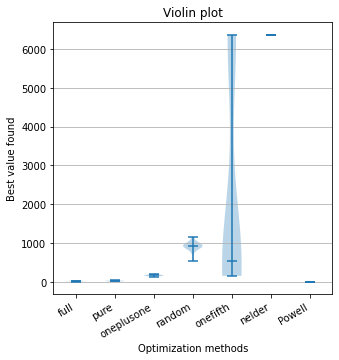

Terminé.


In [60]:
resCMAfull = []
resCMApure = []
resOneplusone = []
resRandom = []
resOneFifthRule = []
resNelder = []
resPowell = []

evaluationBudget = 1000
centerInit = [20]*16
evalFunc = rastrigin
sigma = 2

for i in range(20):
    resCMAfull.append ( launch_cmaes_full(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resCMApure.append ( launch_cmaes_pure(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resOneplusone.append ( launch_oneplusone(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resRandom.append ( launch_random(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )  
    resOneFifthRule.append( launch_ESonefifthRule(centerInit, sigma, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resNelder.append ( launch_nelder(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc) )
    resPowell.append ( launch_powell(centerInit, nbeval=evaluationBudget,display=False,ma_func=evalFunc))

allResults = {"full":resCMAfull,"pure":resCMApure, "oneplusone":resOneplusone, "random":resRandom, "onefifth":resOneFifthRule, "nelder":resNelder, "Powell":resPowell}

plot_violin( allResults )

print ("Terminé.")

_inclure ici quelques commentaires sur vos résultats_

En observant les différents ES avec différents fitness, on remarque que selon le fitness, les ES fonctionnent plus ou moins bien.  
L'algorithme CMA-ES fonctionne plutôt assez bien dans les 3 cas alors que (1+1)-ES est assez dépendant de la courbure du fitness ((1+1)-ES ne fonctionne pas pour la fonction ackley).  
Le ramdom ES quant à lui ne fonctionne pas dans les 3 cas même s'il y a toute même une amélioration des solutions lors des itérations de ES (contraiement au cas de la méthode de nelder pour la fonction rastrigin).  
Enfin les convergences des méthodes de nelder et powell dépendent également du fitness mais la différence est que contrairement au CMA-ES il n'y a pas de randomisation.

---
---
---

# <font color='orange'>PARTIE B: optimisation d'un pendule inversé</font>

OpenAI Gym (https://gym.openai.com/) est un framework permettant de lancer facilement des expériences d'apprentissage par renforcement. Nous allons l'utiliser pour tester les algorithmes évolutionnistes. Pour cet exercice, vous êtes laissé en autonomie: vous devez donc lire attentivement la documentation et les exemples.

# Importation des librairies et définition des fonctions utiles pour la partie B

Remarque: *Il est nécessaire d'exécuter ces cellules une seule fois. En cas de redémarrage du noyau, il faut relancer ces cellules. Il n'est pas nécessaire de regarder le code de ces cellules, elles servent seulement de soutien à la partie B.*

In [61]:
# source: https://colab.research.google.com/drive/124koV4mf1tQ4av9jAJJuWsyuhJyLyd70#scrollTo=G9UWeToN4r7D

#remove " > /dev/null 2>&1" to see what is going on under the hood
!pip install pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1
!pip install gym[atari] > /dev/null 2>&1

from datetime import datetime
from datetime import date

from gym.wrappers import Monitor
import base64
import glob
import io
import base64
from IPython.display import HTML
from IPython import display as ipythondisplay

import gym
from gym import logger as gymlogger
from gym.wrappers import Monitor
gymlogger.set_level(40) #error only
import tensorflow as tf
import numpy as np
import random
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import io
import base64
from IPython.display import HTML

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")

Requirement already up-to-date: setuptools in /usr/local/lib/python3.7/dist-packages (54.2.0)

 2021-03-25 00:58:49 GMT
OK.


In [62]:
# source: https://colab.research.google.com/drive/124koV4mf1tQ4av9jAJJuWsyuhJyLyd70#scrollTo=G9UWeToN4r7D
# modification mineur: ajout de l'argument loop dans la fonction show_video(loop=True)

"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_video(loop=True):
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    if loop == True:
      ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
    else:
      ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else: 
    print("Could not find video")
    
def wrap_env(env):
  env = Monitor(env, './video', force=True)
  return env

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:58:49 GMT
OK.


In [63]:
# A simple neural network object
# source: https://github.com/AsmaBRZ/Evolutionary-algorithms/blob/master/fixed_structure_nn_numpy.py

# coding: utf-8

import numpy as np

## Suppress TF info messages

import os

def sigmoid(x):
    return 1./(1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)


def gen_simplemlp(n_in, n_out, n_hidden_layers=2, n_neurons_per_hidden=5):
    n_neurons = [n_neurons_per_hidden]*n_hidden_layers if np.isscalar(n_neurons_per_hidden) else n_neurons_per_hidden
    i = Input(shape=(n_in,))
    x = i
    for n in n_neurons:
        x = Dense(n, activation='sigmoid')(x)
    o = Dense(n_out, activation='tanh')(x)
    m = Model(inputs=i, outputs=o)
    return m
    

class SimpleNeuralControllerNumpy():
    def __init__(self, n_in, n_out, n_hidden_layers=2, n_neurons_per_hidden=5, params=None):
        self.dim_in = n_in
        self.dim_out = n_out
        # if params is provided, we look for the number of hidden layers and neuron per layer into that parameter (a dicttionary)
        if (not params==None):
            if ("n_hidden_layers" in params.keys()):
                n_hidden_layers=params["n_hidden_layers"]
            if ("n_neurons_per_hidden" in params.keys()):
                n_neurons_per_hidden=params["n_neurons_per_hidden"]
        self.n_per_hidden = n_neurons_per_hidden
        self.n_hidden_layers = n_hidden_layers
        self.weights = None 
        self.n_weights = None
        self.init_random_params()
        self.out = np.zeros(n_out)
        #print("Creating a simple mlp with %d inputs, %d outputs, %d hidden layers and %d neurons per layer"%(n_in, n_out,n_hidden_layers, n_neurons_per_hidden))

    
    def init_random_params(self):
        if(self.n_hidden_layers > 0):
            self.weights = [np.random.random((self.dim_in,self.n_per_hidden))] # In -> first hidden
            self.bias = [np.random.random(self.n_per_hidden)] # In -> first hidden
            for i in range(self.n_hidden_layers-1): # Hidden -> hidden
                self.weights.append(np.random.random((self.n_per_hidden,self.n_per_hidden)))
                self.bias.append(np.random.random(self.n_per_hidden))
            self.weights.append(np.random.random((self.n_per_hidden,self.dim_out))) # -> last hidden -> out
            self.bias.append(np.random.random(self.dim_out))
        else:
            self.weights = [np.random.random((self.dim_in,self.dim_out))] # Single-layer perceptron
            self.bias = [np.random.random(self.dim_out)]
        self.n_weights = np.sum([np.product(w.shape) for w in self.weights]) + np.sum([np.product(b.shape) for b in self.bias])

    def get_parameters(self):
        """
        Returns all network parameters as a single array
        """
        flat_weights = np.hstack([arr.flatten() for arr in (self.weights+self.bias)])
        return flat_weights

    def set_parameters(self, flat_parameters):
        """
        Set all network parameters from a single array
        """
        i = 0 # index
        to_set = []
        self.weights = list()
        self.bias = list()
        if(self.n_hidden_layers > 0):
            # In -> first hidden
            w0 = np.array(flat_parameters[i:(i+self.dim_in*self.n_per_hidden)])
            self.weights.append(w0.reshape(self.dim_in,self.n_per_hidden))
            i += self.dim_in*self.n_per_hidden
            for l in range(self.n_hidden_layers-1): # Hidden -> hidden
                w = np.array(flat_parameters[i:(i+self.n_per_hidden*self.n_per_hidden)])
                self.weights.append(w.reshape((self.n_per_hidden,self.n_per_hidden)))
                i += self.n_per_hidden*self.n_per_hidden
            # -> last hidden -> out
            wN = np.array(flat_parameters[i:(i+self.n_per_hidden*self.dim_out)])
            self.weights.append(wN.reshape((self.n_per_hidden,self.dim_out)))
            i += self.n_per_hidden*self.dim_out
            # Samefor bias now
            # In -> first hidden
            b0 = np.array(flat_parameters[i:(i+self.n_per_hidden)])
            self.bias.append(b0)
            i += self.n_per_hidden
            for l in range(self.n_hidden_layers-1): # Hidden -> hidden
                b = np.array(flat_parameters[i:(i+self.n_per_hidden)])
                self.bias.append(b)
                i += self.n_per_hidden
            # -> last hidden -> out
            bN = np.array(flat_parameters[i:(i+self.dim_out)])
            self.bias.append(bN)
            i += self.dim_out
        else:
            n_w = self.dim_in*self.dim_out
            w = np.array(flat_parameters[:n_w])
            self.weights = [w.reshape((self.dim_in,self.dim_out))]
            self.bias = [np.array(flat_parameters[n_w:])]
        self.n_weights = np.sum([np.product(w.shape) for w in self.weights]) + np.sum([np.product(b.shape) for b in self.bias])
    
    def predict(self,x):
        """
        Propagate
        """
        if(self.n_hidden_layers > 0):
            #Input
            a = np.matmul(x,self.weights[0]) + self.bias[0]
            y = sigmoid(a)
            # hidden -> hidden
            for i in range(1,self.n_hidden_layers-1):
                a = np.matmul(y, self.weights[i]) + self.bias[i]
                y = sigmoid(a)
            # Out
            a = np.matmul(y, self.weights[-1]) + self.bias[-1]
            out = tanh(a)
            return out
        else: # Simple monolayer perceptron
            return tanh(np.matmul(x,self.weights[0]) + self.bias[0])

    def __call__(self,x):
        """Calling the controller calls predict"""
        return self.predict(x)

print("\n",date.today(), datetime.now().strftime("%H:%M:%S"),"GMT") # timestamp is greenwich time
print("OK.")


 2021-03-25 00:58:50 GMT
OK.


---

# Question B-0: simution du pendule inversé

Le code ci-dessous montre comment lancer la simulation d'un pendule inversé en utilisant OpenAI Gym. Etudiez-le et exécutez-le.



In [64]:
import gym
#env = gym.make('CartPole-v1')
env = wrap_env( gym.make('CartPole-v1') ) # colab-specific
observation = env.reset()

#for _ in range(1000):
#while True:
maxEvaluations = 10
evaluation = 0
while evaluation < maxEvaluations:
    env.render()
    action = env.action_space.sample()
    observation, reward, done, info = env.step(action)

    if done:
      evaluation = evaluation + 1
      observation = env.reset()
      print ("obs:",observation,type(observation),observation.shape)
      #show_video(False) # colab-specific

env.close()

show_video() # colab-specific

obs: [-0.02634455  0.02905534  0.01945062  0.02697425] <class 'numpy.ndarray'> (4,)
obs: [ 0.01025179 -0.01242474  0.01445638  0.01891035] <class 'numpy.ndarray'> (4,)
obs: [-0.00055168 -0.00115786 -0.0488358   0.02655781] <class 'numpy.ndarray'> (4,)
obs: [-0.01389479  0.0172163  -0.03948233 -0.00662776] <class 'numpy.ndarray'> (4,)
obs: [ 0.01448035  0.04620811  0.02402545 -0.0149518 ] <class 'numpy.ndarray'> (4,)
obs: [ 0.03144026 -0.01338512  0.01595516 -0.00192562] <class 'numpy.ndarray'> (4,)
obs: [ 0.00471137 -0.04517079 -0.04779206  0.04200277] <class 'numpy.ndarray'> (4,)
obs: [-0.02011069  0.01644235 -0.02170237 -0.03754913] <class 'numpy.ndarray'> (4,)
obs: [ 0.00046439  0.02816601 -0.0449097  -0.02292135] <class 'numpy.ndarray'> (4,)
obs: [ 0.01683596  0.01081387 -0.01055541 -0.00479492] <class 'numpy.ndarray'> (4,)


# Question B-1

En partant de l'exemple de la documentation et du code fourni pour le réseau de neurones dans la première cellule ci-dessous, faites une expérience pour optimiser les paramètres d'un réseau de neurones contrôlant un pendule inversé (environnement 'CartPole-v1') avec CMA-ES. Imposez une limite à 500 pas de temps au-delà de laquelle l'expérience est considérée comme réussie. 

In [65]:
# Exemple de création d'un réseau de neurones multi-couches ("multi-layered perceptron")

nbInputs = 4
nbOutputs = 1
nbHiddenLayers = 2
nbNeuronsPerLayer = 5

nn=SimpleNeuralControllerNumpy(nbInputs,nbOutputs,nbHiddenLayers,nbNeuronsPerLayer) 

# NN parameters

theta = nn.get_parameters() # get default parameters
for i in range(len(theta)):
  theta[i] = random.random()*2.0-1.0 # set our own parameter values
nn.set_parameters(theta)
print ("NN parameters:",theta)

# running NN

observation = np.array( [ -0.03760372,0.00724161,-0.03663132,0.01225319 ], np.float64 )

print ("Input values:", observation)

outputValues = nn.predict(observation)

print ("Output values:", outputValues)


NN parameters: [-0.67651372 -0.41323006 -0.19062332  0.00665299 -0.93452577 -0.02539973
  0.88887985 -0.18314061  0.92357725  0.69981379 -0.35297514  0.63605942
 -0.49865991  0.97297129  0.44338216  0.1326638   0.58661454 -0.70241496
  0.78105644 -0.4081498  -0.85649968  0.78637557 -0.48644939 -0.53313882
 -0.17692998  0.19764797  0.74206485  0.85315826 -0.59136738  0.36581045
 -0.24797051  0.56339968 -0.19717941  0.943525   -0.56357849  0.96260835
 -0.96174077 -0.14161361 -0.83788626 -0.75682177  0.49390191 -0.80076695
 -0.05836477  0.62931955  0.97780145 -0.86451041  0.63734675  0.39536038
  0.77146464  0.02760365 -0.67459541  0.8507637   0.35796853 -0.08104009
 -0.46104553  0.60040438 -0.34622785 -0.76484426 -0.18902512 -0.6206326
  0.90937289]
Input values: [-0.03760372  0.00724161 -0.03663132  0.01225319]
Output values: [0.93136313]


In [66]:
# A compléter 

# Constantes 

nbInputs = 4
nbOutputs = 1
nbHiddenLayers = 2
nbNeuronsPerLayer = 5
env_name = 'CartPole-v1' 
env = wrap_env(gym.make(env_name))

# Fonctions

def reward_function(theta, env):
  nn = SimpleNeuralControllerNumpy(nbInputs, nbOutputs, nbHiddenLayers, nbNeuronsPerLayer) 
  nn.set_parameters(theta)
  observation = env.reset()
  total_reward = 0
  done = False

  while not done:
      if nn.predict(observation)[0] >= 0:
        action = 1
      else:
        action = 0
      
      observation, reward, done, info = env.step(action)
      total_reward += reward

  env.close()

  return total_reward


def initialize_theta(size):
  return np.array([random.random() * 2.0 - 1.0 for i in range(size)])


def learning_cartpole(env, sigma, reach_reward = 500):
  nn = SimpleNeuralControllerNumpy(nbInputs, nbOutputs, nbHiddenLayers, nbNeuronsPerLayer) 
  theta = initialize_theta(len(nn.get_parameters()))
  nn.set_parameters(theta)
  es = cma.CMAEvolutionStrategy(theta, sigma)
  found = False

  while not found and not es.stop():
    child = es.ask()
    f = np.array([- reward_function(child[i], env) for i in range(len(child))])
    es.tell(child, f)
    solution = es.result[0]
    nn.set_parameters(solution)
    best_reward = - np.min(f)
    print("episode_reward = ", best_reward)

    if best_reward >= reach_reward:
      found = True

  return solution, nn, best_reward


def view_cartpole(theta, env, seuil):
  nn = SimpleNeuralControllerNumpy(nbInputs, nbOutputs, nbHiddenLayers, nbNeuronsPerLayer) 
  nn.set_parameters(theta)
  total_reward = 0

  while total_reward < seuil:
    observation = env.reset()
    total_reward = 0
    done = False
    
    while not done:
        if nn.predict(observation)[0] >= 0:
          action = 1
        else:
          action = 0
      
        env.render()
        observation, reward, done, info = env.step(action)
        total_reward += reward

    env.close()

  show_video()


res, nn, val = learning_cartpole(env, 0.5) 

print("controler :", res)
print("max_reward =", val)
view_cartpole(res, env, 500)

print ("Terminé.")

(8_w,16)-aCMA-ES (mu_w=4.8,w_1=32%) in dimension 61 (seed=715229, Thu Mar 25 00:58:51 2021)
episode_reward =  45.0
episode_reward =  31.0
episode_reward =  70.0
episode_reward =  71.0
episode_reward =  342.0
episode_reward =  176.0
episode_reward =  191.0
episode_reward =  500.0
controler : [ 0.11027539  0.41451866  0.2387808  -0.30359885  0.62533981 -1.27709009
  0.68516284  0.04258052  1.03675712 -0.487977   -0.27389485 -0.6364047
  0.4111053   0.77781016 -2.00719366 -1.89752383 -0.90596892 -0.69321452
  1.19045159  0.13395487  0.86698267 -0.67751149 -0.56830082  0.28936107
 -0.57968707  2.17266586 -0.59046131 -1.66542105 -0.76515825  0.46987781
  0.7449414   1.10095987 -0.41493332 -0.34954326 -1.35134457 -0.92840458
  0.54330529  1.13428433 -0.34556008 -0.31245228 -0.93849957 -0.36061314
 -1.52019365 -0.93806725 -0.44920058 -1.67738808  0.13646564 -0.63962283
  2.15724193 -0.63042414  0.50719627 -0.28777685  0.80092635 -0.00460089
 -0.24172716  0.34652353  1.31868002  1.92576086 -0.

Terminé.


_inclure ici quelques commentaires sur vos résultats_

D'après la question B-0, on remarque que chaque action peu importe bonne ou mauvaise donne un reward de 1. Sachant que le but est de faire tenir le pendulum en équilibre le plus longtemps possible, la variable **done** nous permet de dire quand est-ce le pendulum a perdu l'équilibre.  
De ce fait, les performances du pendulum correspond à la somme des rewards avant que **done** vaut **True**. On en déduit que c'est ce mécanisme qui correspond à notre fitness. On doit donc maximiser la somme des rewards avant **done** = **True**.
Or, chaque reward est obtenu en faisant une action. Pour chaque contrôleur, on doit compter le nombre de fois qu'on obtient de bonnes actions consécutives (somme des rewards). Ainsi, comme on sait que le output du neural network est compris entre -1 et 1 et qu'on a deux actions possibles, on en déduit que le output nous permet de sampler les actions (output négatif donne gauche (0), output positif donne droite (1)). 



--- 

# Question B-2

Re-calculez plusieurs fois la fitness du meilleur contrôleur généré. Visualisez les comportements correspondants. Que constatez-vous ? Quel est le problème ? Proposez une solution pour le résoudre.

In [67]:
# A compléter

for i in range(100):
  print(reward_function(res, env))

463.0
500.0
500.0
409.0
500.0
500.0
500.0
487.0
465.0
500.0
391.0
500.0
485.0
495.0
500.0
451.0
452.0
443.0
437.0
439.0
500.0
487.0
500.0
437.0
450.0
427.0
500.0
500.0
451.0
500.0
500.0
500.0
500.0
458.0
500.0
476.0
500.0
474.0
500.0
500.0
414.0
500.0
500.0
464.0
438.0
469.0
486.0
455.0
500.0
457.0
465.0
494.0
436.0
500.0
417.0
468.0
453.0
500.0
493.0
413.0
444.0
449.0
473.0
448.0
500.0
490.0
392.0
500.0
465.0
500.0
500.0
470.0
482.0
435.0
500.0
500.0
500.0
406.0
500.0
500.0
489.0
500.0
500.0
483.0
500.0
437.0
500.0
429.0
500.0
500.0
475.0
500.0
500.0
443.0
443.0
465.0
452.0
426.0
476.0
490.0


_inclure ici quelques commentaires sur vos résultats_

On remarque que le contrôleur optimal ne donne pas tout le temps un pas de 500 car cela dépend l'observation initial. Pour régler ce problème, on peut modifier le fitness en faisant non plus un fitness sur une seule partie de jeu mais sur plusieurs parties et faire la moyenne des pas qui correspond finalement à une agrégation des fitness d'une seule partie. On cherchera alors à maximiser le fitness de la moyenne des pas. Il est aussi intéressant de calculer l'écart-type en plus pour vérifier la fiabilité de la moyenne et on peut donc aussi prendre en compte l'écart-type dans le fitness (maximiser le fitness sous contrainte d'avoir un écart-type faible par exemple).

---
---
---

# <font color='orange'>PARTIE C: exercices bonus</font>

Si vous avez fini tout le reste... A faire en complète autonomie.


# Question C-1: 

A partir de l'implémentation (1+lambda)-ES, implémenter (1) un algorithme (1,lambda)-ES, puis (mu+lambda)-ES et (mu,lambda)-ES. Etudiez l'influence des valeurs de mu et lambda.


In [68]:
# A compléter

# Question C-2:

A partir de l'expérience du pendule inversé, faites le même genre d'expériences avec d'autres environnement proposé dans OpenAI gym, par exemple le BipedalWalker (attention, le temps nécessaire pour l'optimisation peut rapidement devenir très long)


In [69]:
# A compléter

*Fin du sujet.*
